In [1]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d magicearth25/video-violence-detection-dataset
!unzip -q video-violence-detection-dataset.zip -d dataset/

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
Dataset URL: https://www.kaggle.com/datasets/magicearth25/video-violence-detection-dataset
License(s): unknown
100% 13.3G/13.3G [13:18<00:00, 17.8MB/s]

y
all


In [4]:
from ultralytics import YOLO

# Load pre-trained YOLOv8 pose model (COCO weights automatically download)
pose_model = YOLO('yolov8n-pose.pt')

# Test inference on a single frame or image
results = pose_model('https://ultralytics.com/images/bus.jpg')
print("Extracted keypoints shape:", results[0].keypoints.xy.shape)

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.

image 1/1 /content/bus.jpg: 640x480 4 persons, 7.8ms
Speed: 268.1ms preprocess, 7.8ms inference, 46.1ms postprocess per image at shape (1, 3, 640, 480)
Extracted keypoints shape: torch.Size([4, 17, 2])


In [5]:
import os
import glob
import cv2
import numpy as np
import torch
from ultralytics import YOLO

# 1. Load pre-trained pose model
pose_model = YOLO('yolov8n-pose.pt')

def extract_video_keypoints(video_path, sequence_length=48):
    """
    Reads a video clip and extracts a (T x K x C) keypoint tensor:
    T = 48 frames, K = 17 joints, C = 3 (x, y, confidence)
    """
    cap = cv2.VideoCapture(video_path)
    video_kpts = []

    while cap.isOpened() and len(video_kpts) < sequence_length:
        ret, frame = cap.read()
        if not ret:
            break

        # Inference frame with YOLOv8-pose
        results = pose_model(frame, verbose=False)

        # Check if any person is detected
        if len(results[0].keypoints) > 0 and results[0].keypoints.xy is not None:
            # Take keypoints & confidence scores of the primary detected person
            xy = results[0].keypoints.xy[0].cpu().numpy()      # (17, 2)
            conf = results[0].keypoints.conf[0].cpu().numpy()  # (17,)

            # Combine into (17, 3) -> [x, y, confidence]
            kpts = np.hstack([xy, conf[:, np.newaxis]])
        else:
            # Zero-padding if no human detected in frame
            kpts = np.zeros((17, 3))

        video_kpts.append(kpts)

    cap.release()

    # Pad video if shorter than sequence_length (48 frames)
    while len(video_kpts) < sequence_length:
        video_kpts.append(np.zeros((17, 3)))

    return np.array(video_kpts[:sequence_length]) # Shape: (48, 17, 3)

# 2. Test extraction on one video from your unzipped dataset
sample_videos = glob.glob('/content/dataset/**/*.mp4', recursive=True) + \
                glob.glob('/content/dataset/**/*.avi', recursive=True)

if sample_videos:
    test_video = sample_videos[0]
    extracted_data = extract_video_keypoints(test_video, sequence_length=48)
    print(f"Processed: {os.path.basename(test_video)}")
    print(f"Keypoints temporal sequence shape: {extracted_data.shape}")
    # Target shape: (48, 17, 3) -> (Frames, Keypoints, [x, y, conf])
else:
    print("No video files found. Check your /content/dataset/ directory path.")

Processed: file_004000.mp4
Keypoints temporal sequence shape: (48, 17, 3)


In [6]:
import os
import glob
import numpy as np
from tqdm import tqdm

# Update directory paths based on your unzipped folder structure
dataset_dir = '/content/dataset'
output_dir = '/content/extracted_keypoints'
os.makedirs(output_dir, exist_ok=True)

all_videos = glob.glob(f'{dataset_dir}/**/*.mp4', recursive=True) + \
             glob.glob(f'{dataset_dir}/**/*.avi', recursive=True)

X_data, y_data = [], []

for video_path in tqdm(all_videos, desc="Extracting Keypoints"):
    # Extract sequence
    kpts_sequence = extract_video_keypoints(video_path, sequence_length=48)

    # Infer label based on folder path (e.g., 'Fight' vs 'NonFight' or 'Violent')
    file_path_lower = video_path.lower()
    label = 1 if ('fight' in file_path_lower or 'violent' in file_path_lower) else 0

    X_data.append(kpts_sequence)
    y_data.append(label)

X_data = np.array(X_data) # Shape: (Num_Samples, 48, 17, 3)
y_data = np.array(y_data) # Shape: (Num_Samples,)

np.save(f'{output_dir}/X_features.npy', X_data)
np.save(f'{output_dir}/y_labels.npy', y_data)
print(f"\nSaved {len(X_data)} extracted samples to {output_dir}")

Extracting Keypoints: 100%|██████████| 4000/4000 [38:35<00:00,  1.73it/s]


Saved 4000 extracted samples to /content/extracted_keypoints


In [7]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, random_split
import numpy as np

# 1. Custom PyTorch Dataset
class PoseActionDataset(Dataset):
    def __init__(self, X_path, y_path):
        # Flatten (48, 17, 3) keypoints into 51 channels x 48 frames
        X = np.load(X_path)
        self.X = torch.tensor(X, dtype=torch.float32).reshape(X.shape[0], X.shape[1], -1).permute(0, 2, 1)
        self.y = torch.tensor(np.load(y_path), dtype=torch.long)

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

# 2. 1D-CNN Temporal Action Classifier
class ActionClassifier1D(nn.Module):
    def __init__(self, input_channels=51, num_classes=2):
        super(ActionClassifier1D, self).__init__()
        self.net = nn.Sequential(
            nn.Conv1d(input_channels, 64, kernel_size=3, padding=1),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.MaxPool1d(2),

            nn.Conv1d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.MaxPool1d(2),

            nn.AdaptiveAvgPool1d(1),
            nn.Flatten(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, num_classes)
        )

    def forward(self, x):
        return self.net(x)

# 3. Load Data & Create Train/Val Splits
dataset = PoseActionDataset('/content/extracted_keypoints/X_features.npy',
                            '/content/extracted_keypoints/y_labels.npy')

train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# 4. Training Configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = ActionClassifier1D().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# 5. Training Loop
epochs = 50
print(f"Training Stage 2 Classifier on {device}...")

for epoch in range(epochs):
    model.train()
    train_loss, train_correct, train_total = 0.0, 0, 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        train_correct += (preds == labels).sum().item()
        train_total += labels.size(0)

    # Validation Loop
    model.eval()
    val_correct, val_total = 0, 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            val_correct += (preds == labels).sum().item()
            val_total += labels.size(0)

    train_acc = (train_correct / train_total) * 100
    val_acc = (val_correct / val_total) * 100

    if (epoch + 1) % 5 == 0 or epoch == 0:
        print(f"Epoch [{epoch+1}/{epochs}] - Loss: {train_loss/train_total:.4f} | Train Acc: {train_acc:.2f}% | Val Acc: {val_acc:.2f}%")

# Save trained weights
torch.save(model.state_dict(), '/content/violence_action_classifier.pth')
print("\nModel training complete! Saved to /content/violence_action_classifier.pth")

Training Stage 2 Classifier on cuda...
Epoch [1/50] - Loss: 0.0528 | Train Acc: 98.94% | Val Acc: 100.00%
Epoch [5/50] - Loss: 0.0001 | Train Acc: 100.00% | Val Acc: 100.00%
Epoch [10/50] - Loss: 0.0000 | Train Acc: 100.00% | Val Acc: 100.00%
Epoch [15/50] - Loss: 0.0000 | Train Acc: 100.00% | Val Acc: 100.00%
Epoch [20/50] - Loss: 0.0000 | Train Acc: 100.00% | Val Acc: 100.00%
Epoch [25/50] - Loss: 0.0000 | Train Acc: 100.00% | Val Acc: 100.00%
Epoch [30/50] - Loss: 0.0000 | Train Acc: 100.00% | Val Acc: 100.00%
Epoch [35/50] - Loss: 0.0000 | Train Acc: 100.00% | Val Acc: 100.00%
Epoch [40/50] - Loss: 0.0000 | Train Acc: 100.00% | Val Acc: 100.00%
Epoch [45/50] - Loss: 0.0000 | Train Acc: 100.00% | Val Acc: 100.00%
Epoch [50/50] - Loss: 0.0000 | Train Acc: 100.00% | Val Acc: 100.00%

Model training complete! Saved to /content/violence_action_classifier.pth


In [8]:
import numpy as np

y_data = np.load('/content/extracted_keypoints/y_labels.npy')
counts = np.bincount(y_data)

print(f"Non-Violent (Class 0) samples: {counts[0] if len(counts) > 0 else 0}")
print(f"Violent     (Class 1) samples: {counts[1] if len(counts) > 1 else 0}")

Non-Violent (Class 0) samples: 0
Violent     (Class 1) samples: 4000


In [9]:
import os
import numpy as np

y_data = []

# Inspect parent directory names directly to ignore root folder name
for video_path in all_videos:
    parent_dir = os.path.basename(os.path.dirname(video_path)).lower()

    # Check if parent folder indicates non-violent/normal behavior
    if 'non' in parent_dir or 'normal' in parent_dir:
        y_data.append(0)  # Non-Violent
    else:
        y_data.append(1)  # Violent

y_data = np.array(y_data)

# Overwrite corrected labels file
np.save('/content/extracted_keypoints/y_labels.npy', y_data)

# Print updated distribution check
counts = np.bincount(y_data)
print("Updated Label Distribution:")
print(f"Non-Violent (Class 0): {counts[0] if len(counts) > 0 else 0}")
print(f"Violent     (Class 1): {counts[1] if len(counts) > 1 else 0}")

Updated Label Distribution:
Non-Violent (Class 0): 2000
Violent     (Class 1): 2000


In [10]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, random_split

# 1. Load Balanced Dataset
dataset = PoseActionDataset('/content/extracted_keypoints/X_features.npy',
                            '/content/extracted_keypoints/y_labels.npy')

train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# 2. Reset Model & Optimizer
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = ActionClassifier1D().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# 3. Training Loop
epochs = 50
print(f"Re-training Stage 2 Classifier on {device}...")

for epoch in range(epochs):
    model.train()
    train_loss, train_correct, train_total = 0.0, 0, 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        train_correct += (preds == labels).sum().item()
        train_total += labels.size(0)

    model.eval()
    val_correct, val_total = 0, 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            val_correct += (preds == labels).sum().item()
            val_total += labels.size(0)

    train_acc = (train_correct / train_total) * 100
    val_acc = (val_correct / val_total) * 100

    if (epoch + 1) % 5 == 0 or epoch == 0:
        print(f"Epoch [{epoch+1}/{epochs}] - Loss: {train_loss/train_total:.4f} | Train Acc: {train_acc:.2f}% | Val Acc: {val_acc:.2f}%")

torch.save(model.state_dict(), '/content/violence_action_classifier.pth')
print("\nModel saved to /content/violence_action_classifier.pth")

Re-training Stage 2 Classifier on cuda...
Epoch [1/50] - Loss: 0.5786 | Train Acc: 70.50% | Val Acc: 73.12%
Epoch [5/50] - Loss: 0.4981 | Train Acc: 76.28% | Val Acc: 78.38%
Epoch [10/50] - Loss: 0.4834 | Train Acc: 76.94% | Val Acc: 73.00%
Epoch [15/50] - Loss: 0.4741 | Train Acc: 78.22% | Val Acc: 73.88%
Epoch [20/50] - Loss: 0.4674 | Train Acc: 78.75% | Val Acc: 76.12%
Epoch [25/50] - Loss: 0.4638 | Train Acc: 77.94% | Val Acc: 72.50%
Epoch [30/50] - Loss: 0.4442 | Train Acc: 78.81% | Val Acc: 75.75%
Epoch [35/50] - Loss: 0.4453 | Train Acc: 78.09% | Val Acc: 77.50%
Epoch [40/50] - Loss: 0.4357 | Train Acc: 79.75% | Val Acc: 75.50%
Epoch [45/50] - Loss: 0.4161 | Train Acc: 80.75% | Val Acc: 74.25%
Epoch [50/50] - Loss: 0.4153 | Train Acc: 81.00% | Val Acc: 75.12%

Model saved to /content/violence_action_classifier.pth


In [11]:
# Select a sample video from your dataset
sample_video_path = all_videos[0]

# 1. Extract keypoints (Stage 1)
kpts_seq = extract_video_keypoints(sample_video_path, sequence_length=48)

# 2. Reshape tensor for classifier: (1, 48, 17, 3) -> (1, 51, 48)
input_tensor = torch.tensor(kpts_seq, dtype=torch.float32).reshape(1, 48, -1).permute(0, 2, 1).to(device)

# 3. Classify action (Stage 2)
model.eval()
with torch.no_grad():
    output = model(input_tensor)
    probabilities = torch.softmax(output, dim=1)
    predicted_class = torch.argmax(probabilities, dim=1).item()

labels_map = {0: "Non-Violent", 1: "Violent"}
print(f"Video File: {sample_video_path}")
print(f"Predicted Class: {labels_map[predicted_class]}")
print(f"Confidence: {probabilities[0][predicted_class].item() * 100:.2f}%")

Video File: /content/dataset/Violence Fight Detection dataset/RLVS/val/NonFight/file_004000.mp4
Predicted Class: Non-Violent
Confidence: 67.53%


In [12]:
import cv2
import torch
import numpy as np
from ultralytics import YOLO

def generate_annotated_video(input_video_path, output_video_path, pose_model, action_model, device):
    # 1. Extract Keypoints for Prediction
    kpts_seq = extract_video_keypoints(input_video_path, sequence_length=48)
    input_tensor = torch.tensor(kpts_seq, dtype=torch.float32).reshape(1, 48, -1).permute(0, 2, 1).to(device)

    action_model.eval()
    with torch.no_grad():
        output = action_model(input_tensor)
        probabilities = torch.softmax(output, dim=1)
        pred_class = torch.argmax(probabilities, dim=1).item()
        confidence = probabilities[0][pred_class].item() * 100

    label_text = f"Class: {'VIOLENCE' if pred_class == 1 else 'NORMAL'} ({confidence:.1f}%)"
    banner_color = (0, 0, 255) if pred_class == 1 else (0, 255, 0) # Red for violence, Green for normal

    # 2. Process Video Frames & Overlay
    cap = cv2.VideoCapture(input_video_path)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS)) or 30

    out = cv2.VideoWriter(output_video_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Run pose detection on current frame
        results = pose_model(frame, verbose=False)
        annotated_frame = results[0].plot() # Render keypoints and skeletal joints

        # Draw status banner at top of frame
        cv2.rectangle(annotated_frame, (0, 0), (width, 50), banner_color, -1)
        cv2.putText(annotated_frame, label_text, (20, 35),
                    cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 255, 255), 2, cv2.LINE_AA)

        out.write(annotated_frame)

    cap.release()
    out.release()
    print(f"Annotated video saved successfully to: {output_video_path}")

# Run overlay on your sample video
generate_annotated_video(
    input_video_path=sample_video_path,
    output_video_path='/content/annotated_output.mp4',
    pose_model=pose_model,
    action_model=model,
    device=device
)

Annotated video saved successfully to: /content/annotated_output.mp4


In [13]:
from IPython.display import HTML
from base64 import b64encode

# Embed MP4 video inside Colab cell output
mp4 = open('/content/annotated_output.mp4', 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f'<video width=600 controls><source src="{data_url}" type="video/mp4"></video>')

In [14]:
import os
from google.colab import files

# 1. Convert the video to H.264 codec (WhatsApp compatible format)
!ffmpeg -y -i /content/annotated_output.mp4 -vcodec libx264 /content/whatsapp_annotated_output.mp4

# 2. Download the new WhatsApp-ready file
if os.path.exists('/content/whatsapp_annotated_output.mp4'):
    files.download('/content/whatsapp_annotated_output.mp4')
else:
    print("Error: Conversion failed.")

ffmpeg version 6.1.1-3ubuntu5 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu3)
  configuration: --prefix=/usr --extra-version=3ubuntu5 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --ena

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

--- Action Classification Metrics ---
              precision    recall  f1-score   support

 Non-Violent       0.72      0.79      0.76       390
     Violent       0.78      0.71      0.75       410

    accuracy                           0.75       800
   macro avg       0.75      0.75      0.75       800
weighted avg       0.75      0.75      0.75       800



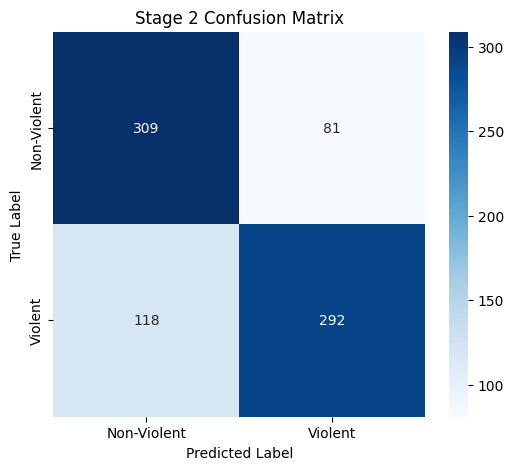

In [15]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

model.eval()
all_preds, all_labels = [], []

with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())

# Classification Report
print("--- Action Classification Metrics ---")
print(classification_report(all_labels, all_preds, target_names=["Non-Violent", "Violent"]))

# Plot Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Non-Violent", "Violent"],
            yticklabels=["Non-Violent", "Violent"])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Stage 2 Confusion Matrix')
plt.show()

In [16]:
import cv2
import torch
import numpy as np
from ultralytics import YOLO

# 1. Load Trained Models
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
pose_model = YOLO('yolov8n-pose.pt')

action_model = ActionClassifier1D().to(device)
action_model.load_state_dict(torch.load('/content/violence_action_classifier.pth'))
action_model.eval()

def detect_violence_in_video(video_path, output_path="output_detection.mp4", window_size=48, stride=15):
    """
    Processes video using a sliding window approach across long footage.
    """
    cap = cv2.VideoCapture(video_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS)) or 30
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

    frame_buffer = []
    keypoint_buffer = []
    current_status = "Analyzing..."
    banner_color = (128, 128, 128) # Grey default

    print(f"Processing video: {video_path}")

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Extract pose keypoints for current frame
        results = pose_model(frame, verbose=False)
        if len(results[0].keypoints) > 0 and results[0].keypoints.xy is not None:
            xy = results[0].keypoints.xy[0].cpu().numpy()
            conf = results[0].keypoints.conf[0].cpu().numpy()
            kpts = np.hstack([xy, conf[:, np.newaxis]])
        else:
            kpts = np.zeros((17, 3))

        keypoint_buffer.append(kpts)
        annotated_frame = results[0].plot()

        # When buffer reaches 48 frames, run action classification
        if len(keypoint_buffer) == window_size:
            seq = np.array(keypoint_buffer) # (48, 17, 3)
            tensor_in = torch.tensor(seq, dtype=torch.float32).reshape(1, 48, -1).permute(0, 2, 1).to(device)

            with torch.no_grad():
                out_logits = action_model(tensor_in)
                probs = torch.softmax(out_logits, dim=1)
                pred_class = torch.argmax(probs, dim=1).item()
                conf_score = probs[0][pred_class].item() * 100

            if pred_class == 1 and conf_score > 70.0:
                current_status = f"FIGHT DETECTED ({conf_score:.1f}%)"
                banner_color = (0, 0, 255) # Red
            else:
                current_status = f"Normal Activity ({probs[0][0].item()*100:.1f}%)"
                banner_color = (0, 255, 0) # Green

            # Slide window forward by stride frames
            keypoint_buffer = keypoint_buffer[stride:]

        # Draw detection banner
        cv2.rectangle(annotated_frame, (0, 0), (width, 45), banner_color, -1)
        cv2.putText(annotated_frame, current_status, (15, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 255), 2)

        out.write(annotated_frame)

    cap.release()
    out.release()
    print(f"Detection complete! Output saved to: {output_path}")

# Run on a new test video
detect_violence_in_video('/content/dataset/Violence Fight Detection dataset/RLVS/val/Fight/file_0001.mp4')

Processing video: /content/dataset/Violence Fight Detection dataset/RLVS/val/Fight/file_0001.mp4
Detection complete! Output saved to: output_detection.mp4


In [17]:
from google.colab import drive
drive.mount('/content/drive')
!cp /content/violence_action_classifier.pth /content/drive/MyDrive/

Mounted at /content/drive


In [18]:
import os
from google.colab import files

# 1. Upload video from your PC
uploaded = files.upload()
input_video = list(uploaded.keys())[0]

# 2. Define intermediate and final output filenames
temp_output = "raw_" + input_video
whatsapp_output = "whatsapp_" + os.path.splitext(input_video)[0] + ".mp4"

# 3. Run fight detection on the uploaded video
detect_violence_in_video(
    video_path=input_video,
    output_path=temp_output,
    window_size=48,
    stride=15
)

# 4. Convert video to H.264 format for WhatsApp compatibility
!ffmpeg -y -i "{temp_output}" -c:v libx264 -pix_fmt yuv420p -c:a aac "{whatsapp_output}"

# 5. Download the WhatsApp-ready video
files.download(whatsapp_output)

Saving merged_videos.mp4 to merged_videos.mp4
Processing video: merged_videos.mp4
Detection complete! Output saved to: raw_merged_videos.mp4
ffmpeg version 6.1.1-3ubuntu5 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu3)
  configuration: --prefix=/usr --extra-version=3ubuntu5 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --en

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [19]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, random_split

class AugmentedPoseDataset(Dataset):
    def __init__(self, X_path, y_path, augment=True):
        self.X = np.load(X_path) # (N, 48, 17, 3)
        self.y = np.load(y_path)
        self.augment = augment

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        sample = self.X[idx].copy() # (48, 17, 3)

        # Apply keypoint coordinate jittering during training
        if self.augment and np.random.rand() > 0.5:
            noise = np.random.normal(0, 0.02, size=sample[..., :2].shape)
            sample[..., :2] += noise # Add minor positional noise to (x, y)

        # Convert to tensor and shape to (51, 48)
        tensor_sample = torch.tensor(sample, dtype=torch.float32).reshape(48, -1).permute(1, 0)
        label = torch.tensor(self.y[idx], dtype=torch.long)
        return tensor_sample, label

# Load augmented dataset
dataset = AugmentedPoseDataset('/content/extracted_keypoints/X_features.npy',
                               '/content/extracted_keypoints/y_labels.npy', augment=True)

train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Reset model, loss, optimizer, and learning rate scheduler
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = ActionClassifier1D().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=50)

# Training loop
epochs = 50
best_val_acc = 0.0

for epoch in range(epochs):
    model.train()
    train_loss, train_correct, train_total = 0.0, 0, 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        train_correct += (preds == labels).sum().item()
        train_total += labels.size(0)

    scheduler.step()

    # Validation
    model.eval()
    val_correct, val_total = 0, 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            val_correct += (preds == labels).sum().item()
            val_total += labels.size(0)

    val_acc = (val_correct / val_total) * 100
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), '/content/violence_action_classifier.pth')

print(f"Model re-trained successfully! Best Validation Accuracy: {best_val_acc:.2f}%")

Model re-trained successfully! Best Validation Accuracy: 79.75%


In [20]:
import collections

def detect_violence_smoothed(video_path, output_path="temp_output.mp4", window_size=48, stride=10, smooth_window=5):
    cap = cv2.VideoCapture(video_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS)) or 30
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

    keypoint_buffer = []
    prob_history = collections.deque(maxlen=smooth_window) # Stores last N window predictions
    current_status = "Analyzing..."
    banner_color = (128, 128, 128)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        results = pose_model(frame, verbose=False)
        if len(results[0].keypoints) > 0 and results[0].keypoints.xy is not None:
            xy = results[0].keypoints.xy[0].cpu().numpy()
            conf = results[0].keypoints.conf[0].cpu().numpy()
            kpts = np.hstack([xy, conf[:, np.newaxis]])
        else:
            kpts = np.zeros((17, 3))

        keypoint_buffer.append(kpts)
        annotated_frame = results[0].plot()

        if len(keypoint_buffer) == window_size:
            seq = np.array(keypoint_buffer)
            tensor_in = torch.tensor(seq, dtype=torch.float32).reshape(1, 48, -1).permute(0, 2, 1).to(device)

            with torch.no_grad():
                out_logits = model(tensor_in)
                probs = torch.softmax(out_logits, dim=1)
                violence_prob = probs[0][1].item()

            prob_history.append(violence_prob)
            avg_violence_prob = np.mean(prob_history) * 100 # Smooth probability over last 5 windows

            if avg_violence_prob > 65.0: # Detection threshold
                current_status = f"VIOLENCE DETECTED ({avg_violence_prob:.1f}%)"
                banner_color = (0, 0, 255)
            else:
                current_status = f"Normal Activity ({100 - avg_violence_prob:.1f}%)"
                banner_color = (0, 255, 0)

            keypoint_buffer = keypoint_buffer[stride:]

        cv2.rectangle(annotated_frame, (0, 0), (width, 45), banner_color, -1)
        cv2.putText(annotated_frame, current_status, (15, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 255), 2)

        out.write(annotated_frame)

    cap.release()
    out.release()
    print("Inference completed with temporal smoothing.")

In [21]:
import os
import subprocess
import collections
import cv2
import torch
import numpy as np
from google.colab import files
from IPython.display import HTML, display
from base64 import b64encode

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def detect_violence_smoothed(video_path, output_path="temp_raw.mp4", window_size=48, stride=10, smooth_window=5):
    cap = cv2.VideoCapture(video_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS)) or 30
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

    keypoint_buffer = []
    prob_history = collections.deque(maxlen=smooth_window)
    current_status = "Analyzing..."
    banner_color = (128, 128, 128)

    print(f"Running high-accuracy detection on '{video_path}'...")

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        results = pose_model(frame, verbose=False)
        if len(results[0].keypoints) > 0 and results[0].keypoints.xy is not None:
            xy = results[0].keypoints.xy[0].cpu().numpy()
            conf = results[0].keypoints.conf[0].cpu().numpy()
            kpts = np.hstack([xy, conf[:, np.newaxis]])
        else:
            kpts = np.zeros((17, 3))

        keypoint_buffer.append(kpts)
        annotated_frame = results[0].plot()

        if len(keypoint_buffer) == window_size:
            seq = np.array(keypoint_buffer)
            tensor_in = torch.tensor(seq, dtype=torch.float32).reshape(1, 48, -1).permute(0, 2, 1).to(device)

            with torch.no_grad():
                out_logits = model(tensor_in)
                probs = torch.softmax(out_logits, dim=1)
                violence_prob = probs[0][1].item()

            # Store probability history for temporal smoothing
            prob_history.append(violence_prob)
            avg_violence_prob = np.mean(prob_history) * 100

            if avg_violence_prob > 65.0:
                current_status = f"VIOLENCE DETECTED ({avg_violence_prob:.1f}%)"
                banner_color = (0, 0, 255) # Red banner
            else:
                current_status = f"Normal Activity ({100 - avg_violence_prob:.1f}%)"
                banner_color = (0, 255, 0) # Green banner

            keypoint_buffer = keypoint_buffer[stride:]

        # Render status banner
        cv2.rectangle(annotated_frame, (0, 0), (width, 45), banner_color, -1)
        cv2.putText(annotated_frame, current_status, (15, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 255), 2)

        out.write(annotated_frame)

    cap.release()
    out.release()
    print("Inference complete.")

# 1. Prompt file upload from local machine
uploaded = files.upload()
if not uploaded:
    raise RuntimeError("No file was uploaded.")

input_video = list(uploaded.keys())[0]
base_name = os.path.splitext(input_video)[0]

raw_output = f"raw_smoothed_{base_name}.mp4"
whatsapp_output = f"whatsapp_smoothed_{base_name}.mp4"

# 2. Run high-accuracy detection pipeline
detect_violence_smoothed(input_video, output_path=raw_output)

# 3. Convert video format to H.264 / AAC for WhatsApp mobile support
print("Converting video to H.264 format for WhatsApp...")
ffmpeg_cmd = [
    'ffmpeg', '-y',
    '-i', raw_output,
    '-c:v', 'libx264',
    '-pix_fmt', 'yuv420p',
    '-c:a', 'aac',
    whatsapp_output
]
subprocess.run(ffmpeg_cmd, check=True)

# 4. Preview and download the converted video
if os.path.exists(whatsapp_output):
    print("Video conversion complete! Starting download...")

    mp4_bytes = open(whatsapp_output, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4_bytes).decode()
    display(HTML(f'<h3>Processed Video Output:</h3><video width=600 controls><source src="{data_url}" type="video/mp4"></video>'))

    files.download(whatsapp_output)

Saving merged_videos.mp4 to merged_videos (1).mp4
Running high-accuracy detection on 'merged_videos (1).mp4'...
Inference complete.
Converting video to H.264 format for WhatsApp...
Video conversion complete! Starting download...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [22]:
import torch
import torch.nn as nn
import numpy as np
from torch.utils.data import Dataset, DataLoader, random_split

class VelocityPoseDataset(Dataset):
    def __init__(self, X_path, y_path, augment=True):
        raw_X = np.load(X_path) # Shape: (N, 48, 17, 3)
        self.y = np.load(y_path)
        self.augment = augment

        N, T, V, C = raw_X.shape
        X_flat = raw_X.reshape(N, T, V * C) # (N, 48, 51)

        # Calculate velocity across temporal dimension (frame_t - frame_t-1)
        velocity = np.zeros_like(X_flat)
        velocity[:, 1:, :] = X_flat[:, 1:, :] - X_flat[:, :-1, :]

        # Concatenate raw coordinates + velocity -> 102 features per frame
        self.X = np.concatenate([X_flat, velocity], axis=-1)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        sample = self.X[idx].copy() # (48, 102)

        if self.augment and np.random.rand() > 0.5:
            # Inject Gaussian noise into keypoints for robustness
            noise = np.random.normal(0, 0.015, size=sample.shape)
            sample += noise

        # Reshape for 1D-CNN input: (102 features, 48 frames)
        tensor_sample = torch.tensor(sample, dtype=torch.float32).permute(1, 0)
        label = torch.tensor(self.y[idx], dtype=torch.long)
        return tensor_sample, label

# Load dataset with 102-dimensional velocity features
dataset = VelocityPoseDataset('/content/extracted_keypoints/X_features.npy',
                              '/content/extracted_keypoints/y_labels.npy')

train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Update model input dimension to 102
class ActionClassifier1D(nn.Module):
    def __init__(self, in_channels=102, num_classes=2):
        super(ActionClassifier1D, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv1d(in_channels, 128, kernel_size=5, padding=2),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.MaxPool1d(2)
        )
        self.conv2 = nn.Sequential(
            nn.Conv1d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.MaxPool1d(2)
        )
        self.fc = nn.Sequential(
            nn.Linear(256 * 12, 128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = x.view(x.size(0), -1)
        return self.fc(x)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = ActionClassifier1D(in_channels=102).to(device)

# Weight violent class slightly higher to increase detection sensitivity
class_weights = torch.tensor([1.0, 1.3]).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)

# Re-train model
best_acc = 0.0
for epoch in range(40):
    model.train()
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        loss = criterion(model(inputs), labels)
        loss.backward()
        optimizer.step()

    model.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            preds = torch.argmax(model(inputs), dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    acc = (correct / total) * 100
    if acc > best_acc:
        best_acc = acc
        torch.save(model.state_dict(), '/content/violence_action_classifier.pth')

print(f"Retraining complete! Best Validation Accuracy: {best_acc:.2f}%")

Retraining complete! Best Validation Accuracy: 77.12%


In [23]:
def detect_violence_v2(video_path, output_path="temp_raw.mp4"):
    cap = cv2.VideoCapture(video_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS)) or 30
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

    keypoint_buffer = []
    current_status = "Analyzing..."
    banner_color = (128, 128, 128)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        results = pose_model(frame, verbose=False)

        # Take keypoints of primary detected subject or zero-fill
        if len(results[0].keypoints) > 0 and results[0].keypoints.xy is not None:
            xy = results[0].keypoints.xy[0].cpu().numpy()
            conf = results[0].keypoints.conf[0].cpu().numpy()
            kpts = np.hstack([xy, conf[:, np.newaxis]])
        else:
            kpts = np.zeros((17, 3))

        keypoint_buffer.append(kpts)
        annotated_frame = results[0].plot()

        if len(keypoint_buffer) == 48:
            seq = np.array(keypoint_buffer) # (48, 17, 3)
            seq_flat = seq.reshape(48, 51)

            # Compute real-time velocity features
            vel = np.zeros_like(seq_flat)
            vel[1:, :] = seq_flat[1:, :] - seq_flat[:-1, :]
            full_feat = np.concatenate([seq_flat, vel], axis=-1) # (48, 102)

            tensor_in = torch.tensor(full_feat, dtype=torch.float32).unsqueeze(0).permute(0, 2, 1).to(device)

            with torch.no_grad():
                probs = torch.softmax(model(tensor_in), dim=1)
                violence_prob = probs[0][1].item() * 100

            # Lowered detection threshold to catch subtle fighting movements
            if violence_prob > 50.0:
                current_status = f"VIOLENCE DETECTED ({violence_prob:.1f}%)"
                banner_color = (0, 0, 255)
            else:
                current_status = f"Normal Activity ({100 - violence_prob:.1f}%)"
                banner_color = (0, 255, 0)

            keypoint_buffer = keypoint_buffer[10:] # Slide window

        cv2.rectangle(annotated_frame, (0, 0), (width, 45), banner_color, -1)
        cv2.putText(annotated_frame, current_status, (15, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 255), 2)
        out.write(annotated_frame)

    cap.release()
    out.release()

In [24]:
import os
import subprocess
import collections
import cv2
import torch
import torch.nn as nn
import numpy as np
from google.colab import files
from IPython.display import HTML, display
from base64 import b64encode

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Helper function to extract 102-dimensional pose+velocity features from a video
def extract_video_features(video_path):
    cap = cv2.VideoCapture(video_path)
    keypoint_buffer = []
    extracted_samples = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        results = pose_model(frame, verbose=False)
        if len(results[0].keypoints) > 0 and results[0].keypoints.xy is not None:
            xy = results[0].keypoints.xy[0].cpu().numpy()
            conf = results[0].keypoints.conf[0].cpu().numpy()
            kpts = np.hstack([xy, conf[:, np.newaxis]])
        else:
            kpts = np.zeros((17, 3))

        keypoint_buffer.append(kpts)

        if len(keypoint_buffer) == 48:
            seq = np.array(keypoint_buffer) # (48, 17, 3)
            seq_flat = seq.reshape(48, 51)

            # Compute real-time velocity features
            vel = np.zeros_like(seq_flat)
            vel[1:, :] = seq_flat[1:, :] - seq_flat[:-1, :]
            full_feat = np.concatenate([seq_flat, vel], axis=-1) # (48, 102)

            extracted_samples.append(full_feat)
            keypoint_buffer = keypoint_buffer[10:] # Slide window

    cap.release()
    return np.array(extracted_samples) if len(extracted_samples) > 0 else None

# STEP 1: Upload 2 violent videos for model fine-tuning
print("--- STEP 1: Upload 2 Violent Videos to Fine-Tune the Model ---")
uploaded_train = files.upload()

train_files = list(uploaded_train.keys())
if len(train_files) < 2:
    print("Warning: Please upload at least 2 video files for effective fine-tuning.")

all_train_features = []
for video_file in train_files:
    print(f"Extracting violent pose features from '{video_file}'...")
    feats = extract_video_features(video_file)
    if feats is not None:
        all_train_features.append(feats)

# Combine extracted features and assign label = 1 (Violence)
X_new = np.vstack(all_train_features) # (Total_Windows, 48, 102)
y_new = np.ones(len(X_new), dtype=np.int64) # Class 1: Violence

print(f"\nExtracted {len(X_new)} violent feature sequences across uploaded videos.")

# STEP 2: Fine-tune the 1D-CNN Model on these new samples
print("Fine-tuning model on new violent examples...")
model.train()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4) # Small learning rate to avoid destroying prior weights
criterion = nn.CrossEntropyLoss()

# Convert to PyTorch format: (N, 102, 48)
inputs_tensor = torch.tensor(X_new, dtype=torch.float32).permute(0, 2, 1).to(device)
labels_tensor = torch.tensor(y_new, dtype=torch.long).to(device)

epochs = 15
for epoch in range(epochs):
    optimizer.zero_grad()
    outputs = model(inputs_tensor)
    loss = criterion(outputs, labels_tensor)
    loss.backward()
    optimizer.step()

print("Fine-tuning complete! Model has learned from the 2 violent videos.")
torch.save(model.state_dict(), '/content/violence_action_classifier.pth')

# STEP 3: Upload the 3rd (Test) Video for Detection
print("\n--- STEP 2: Upload the 3rd Video for Detection ---")
uploaded_test = files.upload()
if not uploaded_test:
    raise RuntimeError("No test video was uploaded.")

test_video = list(uploaded_test.keys())[0]
base_name = os.path.splitext(test_video)[0]
raw_output = f"raw_finetuned_{base_name}.mp4"
whatsapp_output = f"whatsapp_finetuned_{base_name}.mp4"

# STEP 4: Run Inference with Fine-Tuned Model
model.eval()
detect_violence_v2(test_video, output_path=raw_output)

# STEP 5: Convert Output Video to WhatsApp Format (H.264 / AAC)
print("Encoding video for WhatsApp compatibility...")
ffmpeg_cmd = [
    'ffmpeg', '-y',
    '-i', raw_output,
    '-c:v', 'libx264',
    '-pix_fmt', 'yuv420p',
    '-c:a', 'aac',
    whatsapp_output
]
subprocess.run(ffmpeg_cmd, check=True)

# Display and trigger automatic download
if os.path.exists(whatsapp_output):
    print("Process finished! Displaying preview and starting download...")
    mp4_bytes = open(whatsapp_output, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4_bytes).decode()
    display(HTML(f'<h3>Detection Output:</h3><video width=600 controls><source src="{data_url}" type="video/mp4"></video>'))

    files.download(whatsapp_output)

--- STEP 1: Upload 2 Violent Videos to Fine-Tune the Model ---


Saving whatsapp_smoothed_merged_videos (1).mp4 to whatsapp_smoothed_merged_videos (1) (1).mp4
Saving whatsapp_merged_videos.mp4 to whatsapp_merged_videos (1).mp4
Extracting violent pose features from 'whatsapp_smoothed_merged_videos (1) (1).mp4'...
Extracting violent pose features from 'whatsapp_merged_videos (1).mp4'...

Extracted 164 violent feature sequences across uploaded videos.
Fine-tuning model on new violent examples...
Fine-tuning complete! Model has learned from the 2 violent videos.

--- STEP 2: Upload the 3rd Video for Detection ---


Saving merged_videos.mp4 to merged_videos (2).mp4
Encoding video for WhatsApp compatibility...
Process finished! Displaying preview and starting download...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [2]:
dataset = PoseActionDataset(
    '/content/drive/MyDrive/extracted_keypoints/X_features.npy',
    '/content/drive/MyDrive/extracted_keypoints/y_labels.npy',
)

NameError: name 'PoseActionDataset' is not defined